In [ ]:
%load_ext autoreload
%autoreload 2
%load_ext jupyter_black

: 

In [2]:
import matplotlib.pyplot as plt
import torch
import numpy as np
from torch.optim import Adam
from torch.utils.data import TensorDataset, DataLoader
from tqdm import tqdm
from src.models.components.mlp import MyMLPTemperature, MyMLP

import torch
import torchsde
from torch import vmap
from torchdiffeq import odeint

from src.energies.gmm_energy import GMM, GMMTempWrapper
from fab.target_distributions import gmm

from src.energies.base_prior import Prior, MeanFreePrior

from src.models.components.clipper import Clipper

from torch.func import hessian
from math import sqrt
from src.utils.data_utils import remove_mean
from math import sqrt, log

In [3]:
device = "cuda" if torch.cuda.is_available() else "cpu"
print(device)

cuda


### Target Distribution

In [4]:
dimensionality = 2
temperature = 1.0
annealed_temperature = 1 / 2
inverse_temperature = temperature / annealed_temperature  # beta in the paper

target = GMM(
    dimensionality=dimensionality,
    n_mixes=40,
    loc_scaling=40.0,
    log_var_scaling=2.0,
    device=device,
    should_unnormalize=True,
)

annealed_target = GMMTempWrapper(target, beta=int(inverse_temperature))

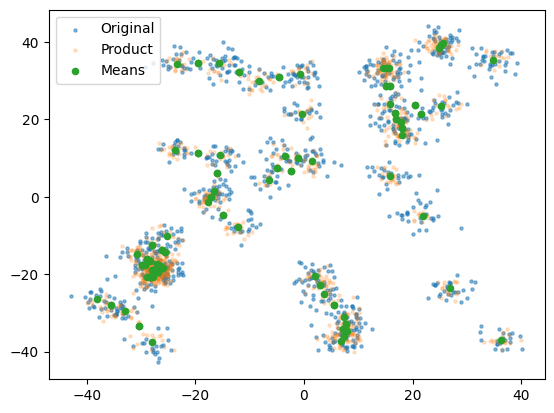

In [5]:
a = target.sample_test_set(1000)
b = annealed_target.sample_test_set(1000)

plt.scatter(
    a[:, 0].detach().cpu(), a[:, 1].detach().cpu(), label="Original", alpha=0.5, s=5
)
plt.scatter(
    b[:, 0].detach().cpu(), b[:, 1].detach().cpu(), label="Product", alpha=0.2, s=5
)
plt.scatter(
    annealed_target.gmm.locs[:, 0].cpu(),
    annealed_target.gmm.locs[:, 1].cpu(),
    label="Means",
    s=20,
)
plt.legend()

In [6]:
num_modes = 10

mode_indices = torch.randint(0, 40, (num_modes,))
modes = target.gmm.locs[mode_indices]
scales = target.gmm.scale_trils[mode_indices]

mix = torch.distributions.Categorical(logits=torch.ones(num_modes).to(device))
com = torch.distributions.MultivariateNormal(
    modes, scale_tril=scales, validate_args=False
)
multi_mode_dist = torch.distributions.MixtureSameFamily(
    mixture_distribution=mix, component_distribution=com, validate_args=False
)

In [7]:
one_mode_samples = torch.randn(1000, 2).to(device) * target.gmm.scale_trils[10][
    0, 0
] + target.gmm.locs[10][None, :].repeat(1000, 1)
init_samples = multi_mode_dist.sample((5000,))

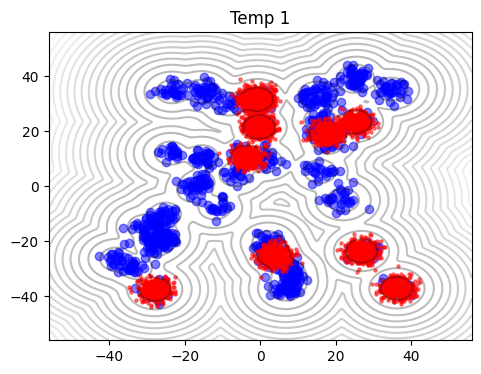

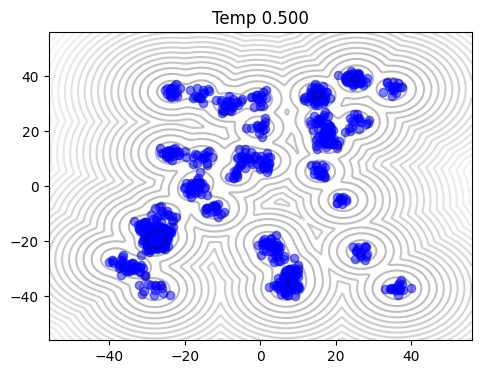

In [8]:
target.get_dataset_fig(a, title="Temp 1")
plt.scatter(
    init_samples[:, 0].detach().cpu(),
    init_samples[:, 1].detach().cpu(),
    c="r",
    label="One mode",
    alpha=0.5,
    s=5,
)
plt.show()

# title is annealed temperature up to 3 decimal points
annealed_target.get_dataset_fig(b, title=f"Temp {annealed_temperature:.3f}")
plt.show()

## Functions

In [9]:
from src.models.components.utils import rademacher, compute_laplacian_hutchinson
from src.models.components.utils import sample_cat_sys

In [10]:
def true_Ut(target, t, x, noise_schedule, ve=True):
    h_t = noise_schedule.h(t).to(device)
    mean_coeff = None
    if not ve:
        mean_coeff = noise_schedule.log_mean(t).to(device)
    target.gmm.convolve(
        h_t * (target.data_normalization_factor**2),
        t,
        var_exploding=ve,
        mean_coeff=mean_coeff,
    )
    logp = target(x)
    target.gmm.reset()
    return -logp


def true_nabla_Ut(target, t, x, noise_schedule, ve=True):
    nabla_Ut = torch.func.jacrev(true_Ut, argnums=2)(target, t, x, noise_schedule, ve)
    return nabla_Ut


def true_dUt_dt(target, t, x, noise_schedule, ve=True):
    dUt_dt = torch.func.jacrev(true_Ut, argnums=1)(target, t, x, noise_schedule, ve)
    return dUt_dt


# def compute_laplacian_true_exact(target, t, x, noise_schedule):
#     def compute_hessian(target, t, x):
#         return hessian(true_Ut, argnums=2)(target, t, x, noise_schedule)
#     hessian_matrix = torch.vmap(compute_hessian, in_dims=(None, 0, 0))(target, t, x)
#     laplacian = hessian_matrix.diagonal(offset=0, dim1=-2, dim2=-1).sum(dim=-1)
#     return laplacian


def compute_laplacian_true_exact(true_nabla_Ut, x):
    N, d = x.shape
    hessian_matrix = torch.zeros(N, d, d, device=x.device, dtype=x.dtype)

    # Compute the Hessian row-wise
    for i in range(d):  # ∂(∇U_t)_i / ∂x
        grad2 = torch.autograd.grad(
            true_nabla_Ut[:, i].sum(), x, retain_graph=True, create_graph=True
        )[0]
        hessian_matrix[:, i, :] = grad2  # i-th row
    laplacian = hessian_matrix.diagonal(offset=0, dim1=-2, dim2=-1).sum(dim=-1)
    return laplacian


# def compute_laplacian_true_exact(target, t, xt, noise_schedule):
#     def func_wrap(t, xt):
#         return true_Ut(
#             target, t.unsqueeze(0), xt.unsqueeze(0), noise_schedule
#         ).squeeze()

#     # Calculate the Hessian matrix of the model output with respect to the input
#     hessian_matrix = vmap(hessian(func_wrap, argnums=1))(t, xt)

#     # Calculate the Laplacian as the trace of the Hessian matrix
#     laplacian = hessian_matrix.diagonal(offset=0, dim1=-2, dim2=-1).sum(dim=-1)
#     return laplacian.detach()

In [11]:
def compute_laplacian_exact(model, t, xt, beta):
    def func_wrap(t, xt):
        return model(t.unsqueeze(0), xt.unsqueeze(0), beta).squeeze()

    # Calculate the Hessian matrix of the model output with respect to the input
    hessian_matrix = vmap(hessian(func_wrap, argnums=1))(t, xt)

    # Calculate the Laplacian as the trace of the Hessian matrix
    laplacian = hessian_matrix.diagonal(offset=0, dim1=-2, dim2=-1).sum(dim=-1)
    return laplacian.detach()


def compute_divergence(model, t, xt, beta):
    def func_wrap(t, xt):
        return model(t.unsqueeze(0), xt.unsqueeze(0), beta).squeeze()

    # Calculate the Hessian matrix of the model output with respect to the input
    nabla_bt = vmap(torch.func.jacrev(func_wrap, argnums=1))(t, xt)

    # Calculate the Laplacian as the trace of the Hessian matrix
    div_bt = nabla_bt.diagonal(offset=0, dim1=-2, dim2=-1).sum(dim=-1)
    return div_bt.detach()


def compute_laplacian(model, nabla_Ut, t, xt, beta, n_samples=1, exact=True):
    if exact:
        return compute_laplacian_exact(model, t, xt, beta)
    else:
        laplacian = 0
        for _ in range(n_samples):
            laplacian += compute_laplacian_hutchinson(nabla_Ut, t, xt)
        return laplacian / n_samples

### Integrators

In [15]:
def euler_maruyama_step(
    sde: VEReverseSDE,
    t: torch.Tensor,
    x: torch.Tensor,
    a: torch.tensor,
    dt: float,
    step: int,
    batch_size: int,
    diffusion_scale=1.0,
    resampling_interval=-1,
    inverse_temp=1.0,
):
    # Calculate drift and diffusion terms for num_eval_batches

    drift_Xt = torch.zeros_like(x)
    drift_At = torch.zeros_like(a)

    for i in range(x.shape[0] // batch_size):
        drift_Xt_i, drift_At_i = sde.f(
            t,
            x[i * batch_size : (i + 1) * batch_size],
            inverse_temp,
            resampling_interval,
        )
        drift_Xt[i * batch_size : (i + 1) * batch_size] = drift_Xt_i
        drift_At[i * batch_size : (i + 1) * batch_size] = drift_At_i

    # drift_Xt, drift_At = sde.f(t, x, resampling_interval)
    drift_Xt = drift_Xt * dt
    drift_At = drift_At * dt

    if t.dim() == 0:
        # repeat the same time for all points if we have a scalar time
        t = t * torch.ones(x.shape[0]).to(x.device)
    diffusion = (
        diffusion_scale
        * sde.g(t)[:, None]
        * np.sqrt(dt)
        * torch.randn_like(x).to(x.device)
    )

    # Update the state
    x_next = x + drift_Xt + diffusion
    a_next = a + drift_At

    if (resampling_interval == -1) or (step + 1) % resampling_interval != 0:
        return x_next, a_next, x.shape[0]

    # resample based on the weights
    choice, _ = sample_cat_sys(x.shape[0], a_next)
    x_next = x_next[choice]
    a_next = torch.zeros_like(a_next)

    return x_next, a_next, len(np.unique(choice))


def integrate_sde_coupled(
    sde,
    x0,
    t_span,
    dt,
    diffusion_scale,
    resampling_interval,
    inverse_temp,
    resample_at_end,
    batch_size,
):
    times = torch.arange(t_span[0], t_span[1], dt).to(device)
    x = x0
    x0.requires_grad = True
    samples = []
    logweights = []
    choices = []
    a = torch.zeros(x.shape[0]).to(device)
    with torch.no_grad():
        for step, t in enumerate(times):
            x, a, choice = euler_maruyama_step(
                sde,
                1 - t,
                x,
                a,
                dt,
                step + 1,
                batch_size=batch_size,
                diffusion_scale=diffusion_scale,
                resampling_interval=resampling_interval,
                inverse_temp=inverse_temp,
            )
            samples.append(x)
            logweights.append(a)
            choices.append(choice)

        if resample_at_end:
            t = torch.tensor(t_span[1]).to(device)
            # resample at the last step:
            target_logprob = target(x) * sde.gamma
            if t.dim() == 0:
                t = t * (torch.ones(x.shape[0])).to(x.device)
                h_t = sde.noise_schedule.h(1 - t)
            model_energy = sde.energy_net.forward_energy(
                h_t, x, inverse_temp, pin=sde.pin_energy, gamma=sde.gamma, t=1 - t
            )
            logq_0 = -model_energy
            a_next = target_logprob - logq_0 + a
            # a_next = torch.clamp(a_next, -10, 10)
            choice, _ = sample_cat_sys(x.shape[0], a_next)
            # print number of unique samples
            print(len(np.unique(choice)))
            x = x[choice]
            logweights.append(a_next)
            samples.append(x)
            choices.append(len(np.unique(choice)))

    return torch.stack(samples), torch.stack(logweights), np.array(choices)


def generate_samples_weighted(
    reverse_sde,
    prior,
    num_samples=1000,
    t_span=(0, 1),
    num_integration_steps=1000,
    samples=None,
    diffusion_scale=1.0,
    resampling_interval=-1,
    inverse_temp=1,
    resample_at_end=False,
    batch_size=None,
):

    if samples is None:
        samples = prior.sample(num_samples)

    dt = 1 / num_integration_steps
    if batch_size is None:
        batch_size = samples.shape[0]

    samples, weights, choices = integrate_sde_coupled(
        sde=reverse_sde,
        x0=samples,
        t_span=t_span,
        dt=dt,
        resampling_interval=resampling_interval,
        diffusion_scale=diffusion_scale,
        inverse_temp=inverse_temp,
        resample_at_end=resample_at_end,
        batch_size=batch_size,
    )
    return samples[-1], weights, choices

### Model

In [16]:
from torch import nn


class EnergyNet(nn.Module):
    def __init__(self, score_net: nn.Module, target, betas, noise_schedule, prior=None):
        super(EnergyNet, self).__init__()
        self.score_net = score_net
        self.prior = prior
        self.noise_schedule = noise_schedule
        self.energy_function = {}
        self.c = nn.Parameter(torch.tensor(0.0))

    def forward_energy(
        self,
        h_t: torch.Tensor,
        x: torch.Tensor,
        beta,
        pin=False,
        gamma=1.0,
        t=None,
    ) -> torch.Tensor:
        U_0 = -target(x) * beta  # this should be beta
        U_0 = torch.clamp(U_0, max=1e3, min=-1e3)

        beta = beta * torch.ones(x.shape[0]).to(x.device)
        beta = beta.unsqueeze(1)

        # h_t = self.noise_schedule.h(t).to(device)

        c_s = 1 / (1 + h_t)  # 1 / (1 + sigma^2)
        c_in = 1 / (1 + h_t) ** 0.5  # 1 / sqrt(1 + sigma^2)
        c_out = h_t**0.5 * c_in  # sigma / sqrt(1 + sigma^2)
        c_noise = (1 / 8) * torch.log(h_t)  # 1/4 ln(sigma)

        def f_theta(t, xt, beta):
            h_theta = self.score_net(t, xt, beta)
            # h_theta = self.score_net(t, xt)
            return torch.sum(h_theta * xt, dim=1)

        U_theta = f_theta(c_noise, c_in[:, None] * x, beta)

        E_theta = (1 - c_s) / (2 * h_t) * torch.linalg.norm(x, dim=-1) ** 2 - c_out / (
            c_in * h_t
        ) * U_theta

        if pin:
            assert t is not None
            return (1 - t) ** 3 * U_0 + (1 - (1 - t) ** 3) * E_theta
        return E_theta

    def forward(
        self, h_t: torch.Tensor, x: torch.Tensor, beta, pin=False, t=None
    ) -> torch.Tensor:
        # beta = beta * torch.ones(x.shape[0]).to(x.device)
        # beta = beta.unsqueeze(1)
        # return self.score_net(t, x, beta)
        U = self.forward_energy(h_t, x, beta, pin, t=t)
        nabla_U = torch.autograd.grad(U.sum(), x, create_graph=True)[0]
        return nabla_U

## Training

### Functions

In [17]:
def score_loss(energy_net, x, h_t, beta):
    x.requires_grad = True

    z = torch.randn_like(x)
    xt = x + z * h_t[:, None] ** 0.5

    s_pred = -energy_net.forward(h_t, xt, beta)
    s_true = -z

    lambda_t = (h_t + 1) / h_t
    s_diff = torch.sum(
        (s_pred * h_t[:, None] ** 0.5 - s_true) ** 2, dim=(-1)
    )  # * lambda_t
    return s_diff.mean()

In [18]:
# def score_loss(energy_net, x, t, noise_schedule, beta):
#     h_t = noise_schedule.h(t.unsqueeze(1))
#     x.requires_grad = True

#     z = torch.randn_like(x)
#     xt = x + z * h_t**0.5

#     s_pred = energy_net.forward(t, xt, beta)
#     s_true = torch.vmap(true_nabla_Ut, in_dims=(None, 0, 0, None))(
#         target, t, xt, noise_schedule
#     )
#     s_diff = torch.sum((s_pred - s_true) ** 2, dim=(-1))  # * lambda_t
#     return s_diff.mean()

In [19]:
from torchcfm.conditional_flow_matching import ConditionalFlowMatcher
from src.models.components.mlp import MyMLP

FM = ConditionalFlowMatcher(sigma=0.0)


def cfm_loss(model, x1, t, beta):
    h_t = noise_schedule.h(t.unsqueeze(1))
    x0 = torch.randn_like(x1)
    t, xt, ut = FM.sample_location_and_conditional_flow(x0, x1)

    vt = model(t, xt, beta)
    loss = torch.mean((vt - ut) ** 2)
    return loss

In [20]:
def cfm_inference(model, xt, t, beta, dt):
    with torch.no_grad():
        vt = model(t * torch.ones(xt.shape[0]).to(device), xt, beta)
        xt_new = xt + vt * dt
        return xt_new

In [21]:
def generate_samples_ode(model, prior, beta, n_samples=1000, t_span=[0, 1], dt=0.001):
    times = torch.arange(t_span[0], t_span[1], dt).to(device)
    samples = []
    x = prior.sample(n_samples)
    with torch.no_grad():
        for t in times:
            x = cfm_inference(model, x, t, beta, 1e-3)
            samples.append(x)
    return torch.stack(samples)[-1]

### Loop

In [22]:
from src.models.components.noise_schedules import (
    GeometricNoiseSchedule,
    ElucidatingNoiseSchedule,
)

# noise_schedule = GeometricNoiseSchedule(sigma_min=0.001, sigma_max=5)
noise_schedule = ElucidatingNoiseSchedule(sigma_min=0.002, sigma_max=80, rho=7)

# betas = [1, 2, 3, 4]
betas = [1.0]  # torch.arange(1, 5, 0.5)

In [23]:
priors = {}
for beta in betas:
    priors[beta] = Prior(2, device=device, scale=(noise_schedule.h(1) / beta) ** 0.5)

In [24]:
from src.models.components.prioritised_replay_buffer import SimpleBuffer

buffer = {}

for beta in betas:
    buffer[beta] = SimpleBuffer(
        2,
        10000,
        1000,
        initial_sampler=None,
        device=device,
        fill_buffer_during_init=False,
        sample_with_replacement=True,
        prioritize=False,
    )

Buffer not initialised, expected that checkpoint will be loaded.


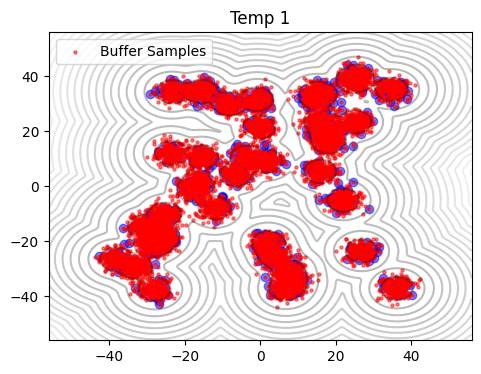

In [25]:
outer_epochs = 100
inner_epochs = 100
batch_size = 1024


init_samples = target.sample_test_set(10000)
# init_samples = multi_mode_dist.sample((5000,))
# init_samples = Prior(
#     2, device=device, scale=(0.4 * target.data_normalization_factor**2 / beta) ** 0.5
# ).sample(5000)
init_samples_normalized = target.normalize(init_samples)
init_samples_energy = target(init_samples_normalized)

target.get_dataset_fig(a, title="Temp 1")
plt.scatter(
    init_samples[:, 0].detach().cpu(),
    init_samples[:, 1].detach().cpu(),
    c="r",
    label="Buffer Samples",
    alpha=0.5,
    s=5,
)
plt.legend()
plt.show()

train_dataset = TensorDataset(
    init_samples_normalized.detach(), init_samples_energy.clone()
)
trainloader = {}

for beta in betas:
    trainloader[beta] = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)

In [26]:
score_net = MyMLPTemperature().to(device)
# score_net = MyMLP().to(device)
energy_net = EnergyNet(
    score_net, target=target, betas=betas, noise_schedule=noise_schedule
).to(device)
optimizer = Adam(energy_net.parameters(), lr=1e-3)
weighted = False

In [14]:
class VEReverseSDE(torch.nn.Module):
    def __init__(
        self, energy_net, noise_schedule, score_model=None, gamma=1.0, pin_energy=False
    ):
        super().__init__()
        self.energy_net = energy_net
        self.score_model = score_model
        self.noise_schedule = noise_schedule
        self.gamma = gamma
        self.pin_energy = pin_energy

    def f(self, t, x, beta, resampling_interval=-1):
        if t.dim() == 0:
            # repeat the same time for all points if we have a scalar time
            t = t * torch.ones(x.shape[0]).to(x.device)

        with torch.enable_grad():
            x.requires_grad_(True)
            t.requires_grad_(True)
            h_t = self.noise_schedule.h(t).to(device)

            nabla_Ut = self.energy_net(h_t, x, beta)
            # nabla_Ut = torch.vmap(true_nabla_Ut, in_dims=(None, 0, 0, None))(
            #     target, t, x, self.noise_schedule
            # )

            if self.score_model is not None:
                model_out = self.score_model(h_t, x, beta)
                bt = -model_out * self.g(t).pow(2).unsqueeze(-1) / 2
            else:
                bt = -nabla_Ut * self.g(t).pow(2).unsqueeze(-1) / 2

            drift_X = self.gamma * (-nabla_Ut * self.g(t).pow(2).unsqueeze(-1) / 2 + bt)

            # if int(t[0] * 1000) % 100 == 0:
            #     print(
            #         "time: ",
            #         t[0],
            #         (torch.linalg.norm(model_out - nabla_Ut) ** 2).mean().item(),
            #     )

            drift_A = torch.zeros(x.shape[0]).to(x.device)

            if resampling_interval == -1 or t[0] > 0.9:
                return drift_X.detach(), drift_A.detach()

            Ut = self.energy_net.forward_energy(
                h_t, x, beta, pin=self.pin_energy, gamma=self.gamma, t=t
            )
            # Ut = torch.vmap(true_Ut, in_dims=(None, 0, 0, None))(
            #     target, t, x, self.noise_schedule
            # )
            if self.score_model is not None:
                div_bt = compute_laplacian_true_exact(
                    bt,
                    x,
                )
            else:
                laplacian_Ut = compute_laplacian_true_exact(
                    nabla_Ut,
                    x,
                )
                div_bt = -laplacian_Ut * (self.g(t).pow(2) / 2)

            dUt_dt = torch.autograd.grad(Ut.sum(), t, create_graph=True)[0]

            drift_A = (
                self.gamma**2 * (-nabla_Ut * bt).sum(-1)
                + self.gamma * div_bt
                + self.gamma * dUt_dt
            )

        return drift_X.detach(), drift_A.detach()

    def g(self, t):
        g = self.noise_schedule.g(t)
        return g

  0%|          | 0/100 [00:00<?, ?it/s]

Epoch 0 | Loss 0.669280
Epoch 99 | Loss 0.598867
hi
not_resampled data
8000
resampled_data
2


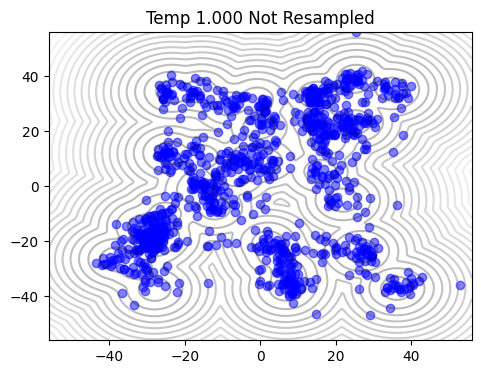

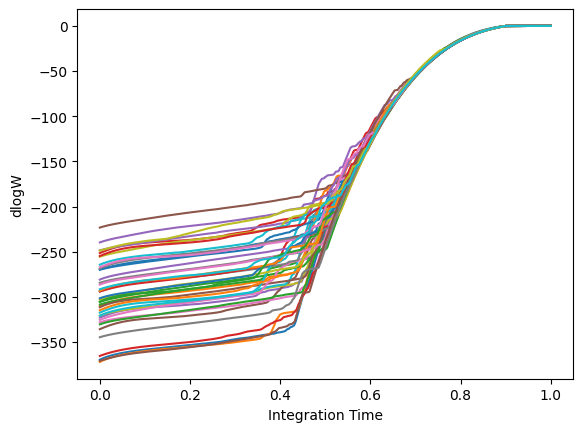

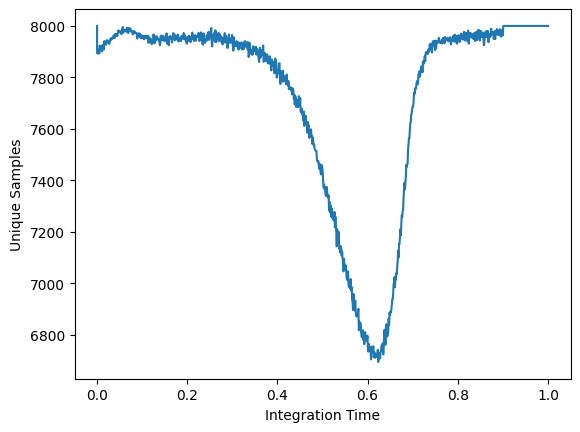

Mean of Energy tensor(-6.9811, device='cuda:0')


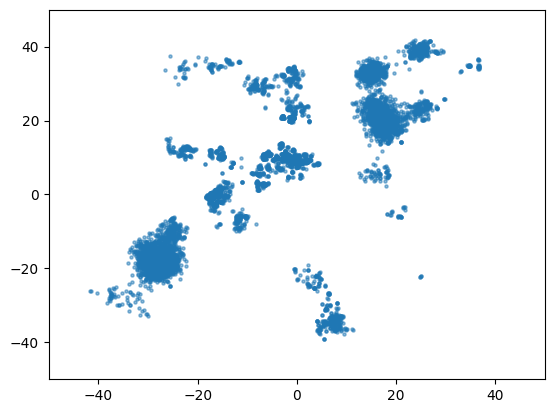

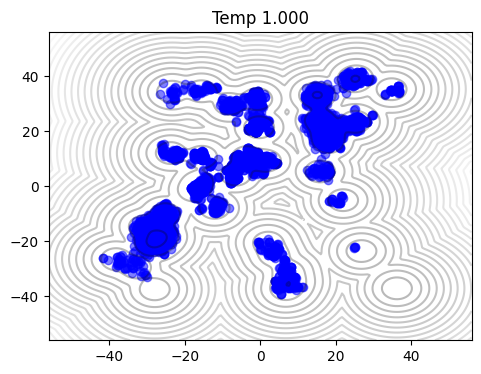

  1%|          | 1/100 [00:38<1:04:08, 38.88s/it]

Epoch 0 | Loss 0.593330
Epoch 99 | Loss 0.540170
hi
not_resampled data
8000
resampled_data
4


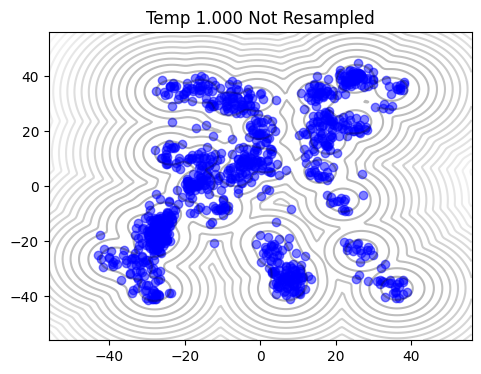

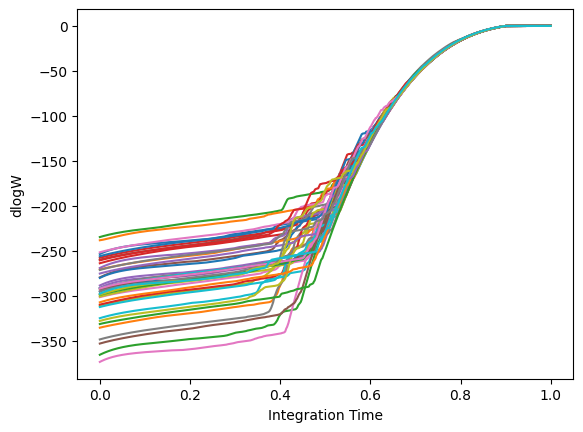

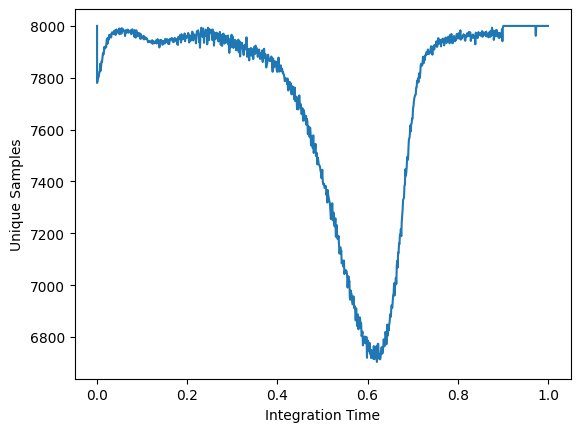

Mean of Energy tensor(-6.9503, device='cuda:0')


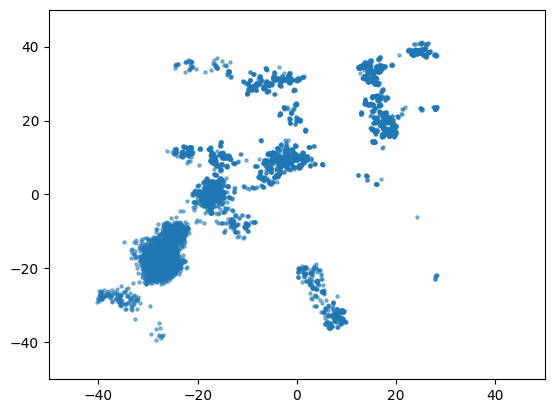

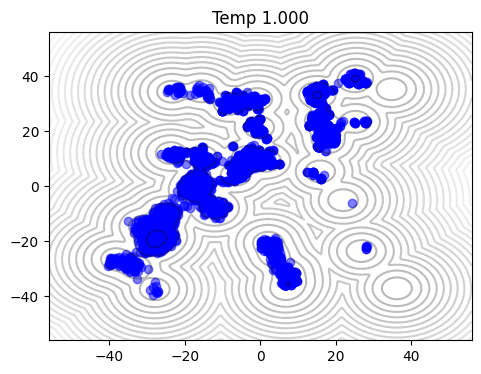

  2%|▏         | 2/100 [01:17<1:03:16, 38.74s/it]

Epoch 0 | Loss 0.581882
Epoch 99 | Loss 0.568161
hi
not_resampled data
8000
resampled_data
1


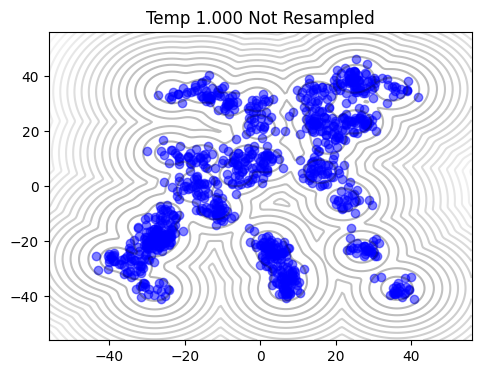

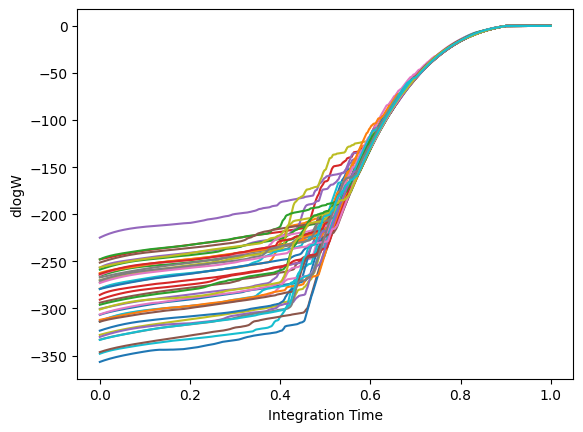

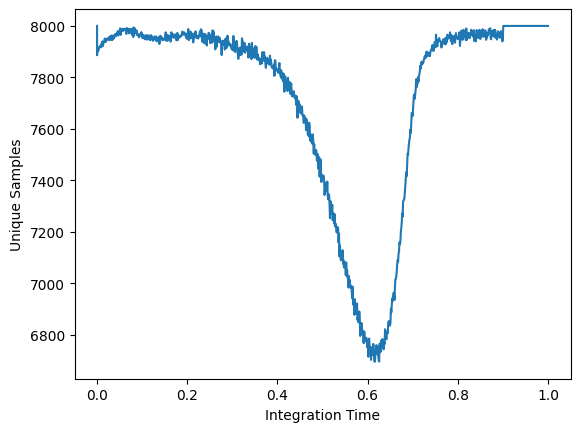

Mean of Energy tensor(-6.8712, device='cuda:0')


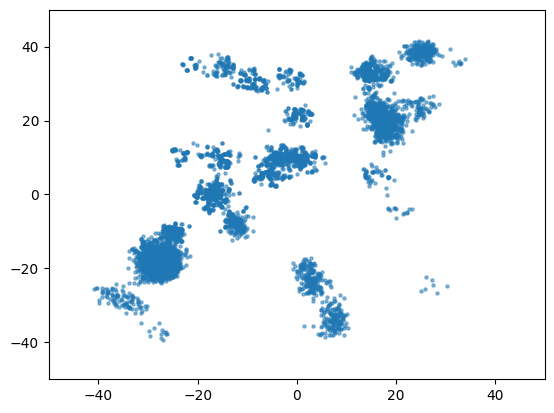

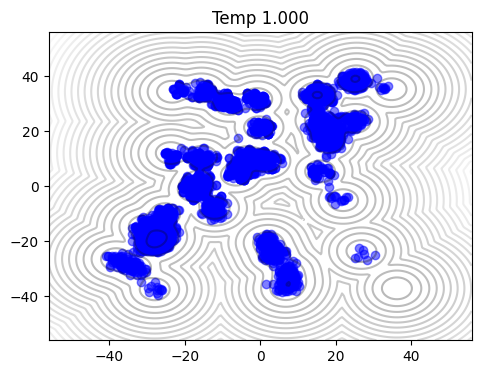

  3%|▎         | 3/100 [01:55<1:02:15, 38.51s/it]

Epoch 0 | Loss 0.608300
Epoch 99 | Loss 0.557143
hi
not_resampled data
8000
resampled_data
3


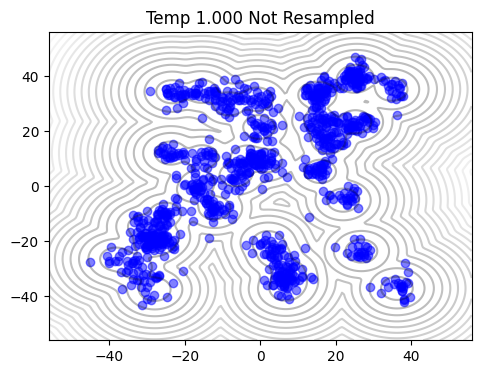

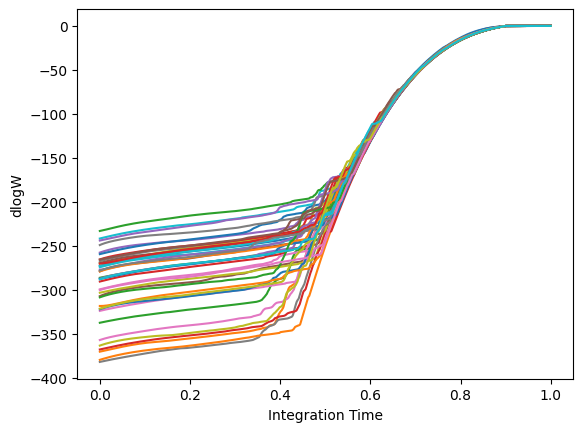

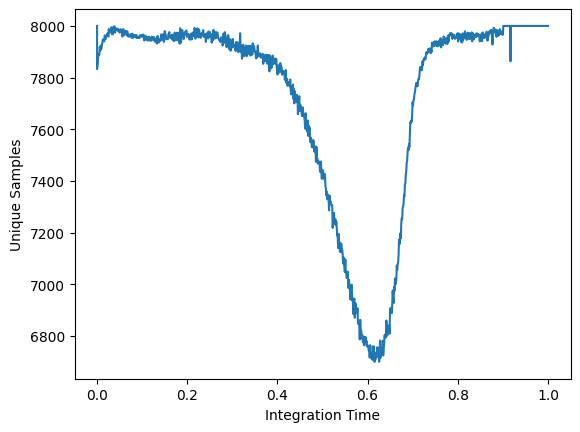

Mean of Energy tensor(-6.9749, device='cuda:0')


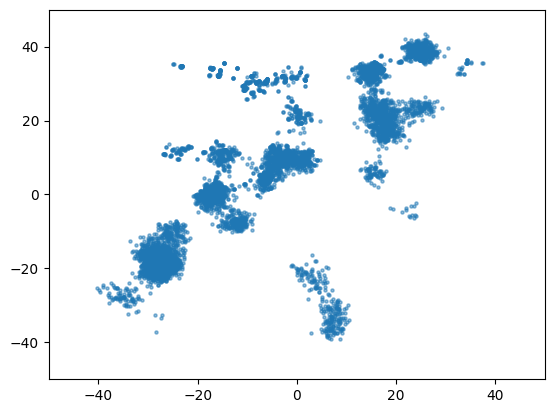

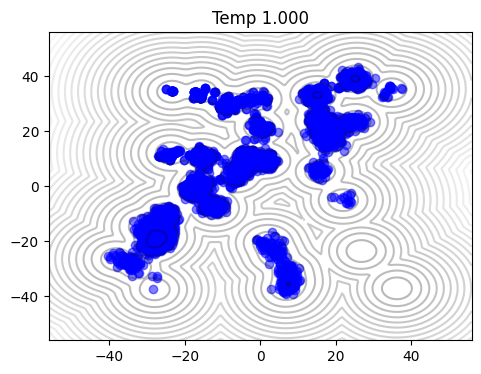

  4%|▍         | 4/100 [02:34<1:01:32, 38.46s/it]

Epoch 0 | Loss 0.603951
Epoch 99 | Loss 0.568140
hi
not_resampled data
8000
resampled_data
2


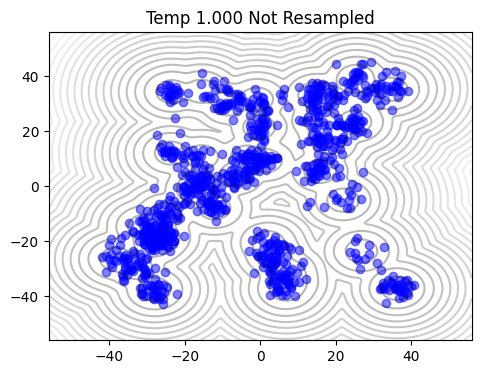

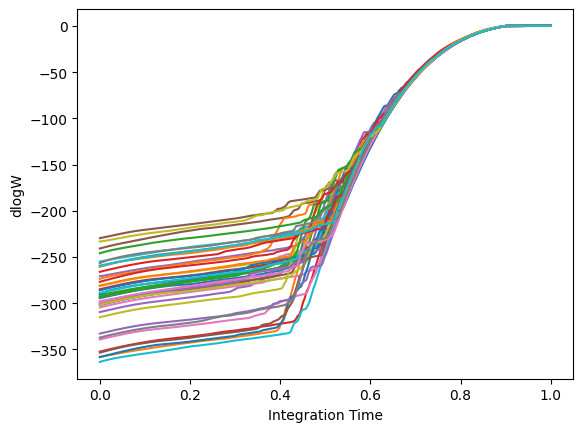

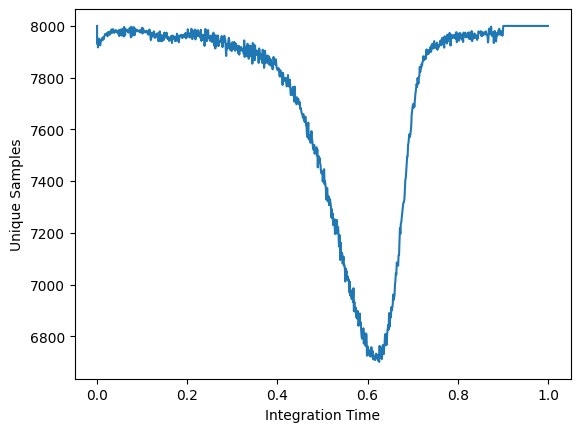

Mean of Energy tensor(-6.9870, device='cuda:0')


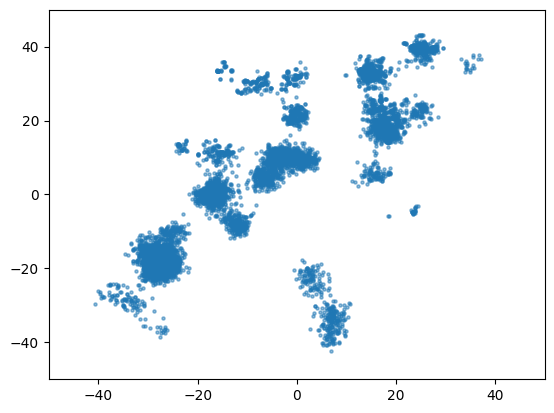

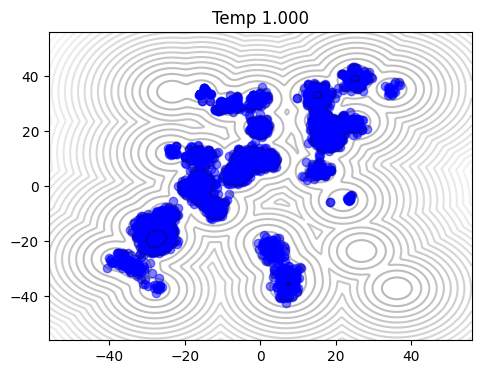

  5%|▌         | 5/100 [03:13<1:01:11, 38.65s/it]

Epoch 0 | Loss 0.611524
Epoch 99 | Loss 0.634642
hi
not_resampled data
8000
resampled_data
4


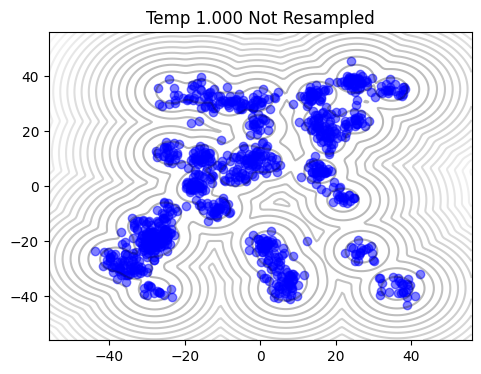

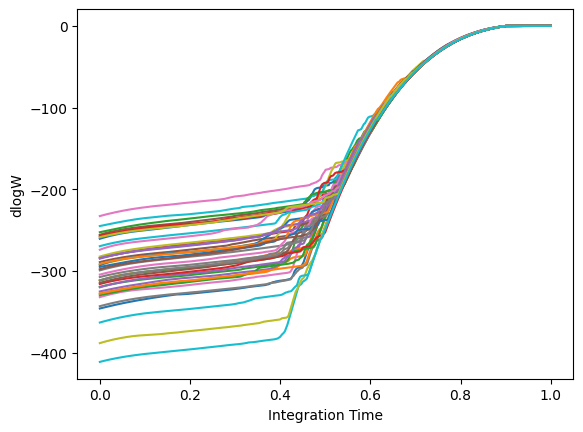

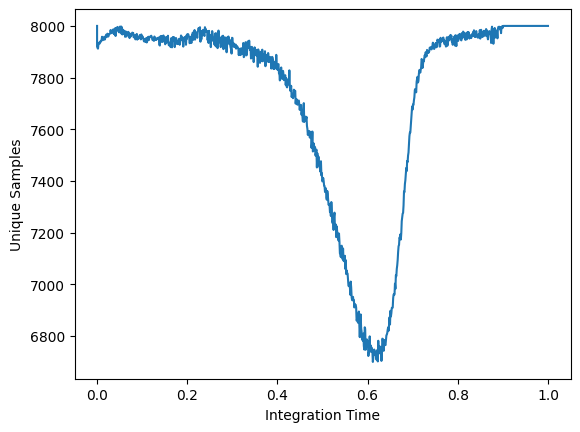

Mean of Energy tensor(-6.9763, device='cuda:0')


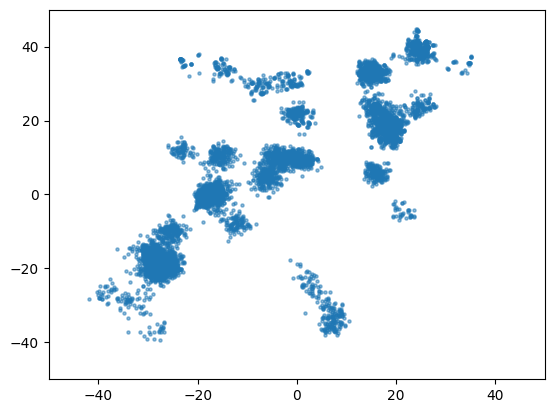

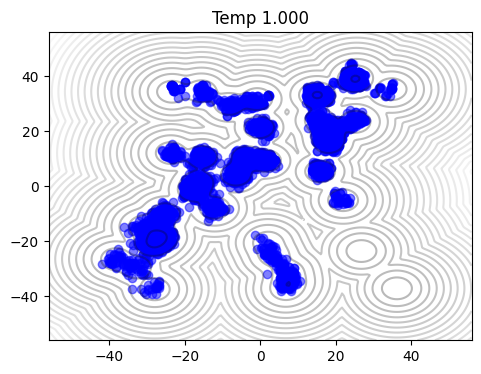

  6%|▌         | 6/100 [03:51<1:00:37, 38.70s/it]

Epoch 0 | Loss 0.648648
Epoch 99 | Loss 0.551638
hi
not_resampled data
8000
resampled_data
3


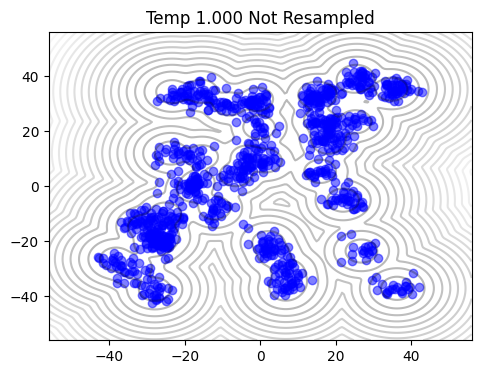

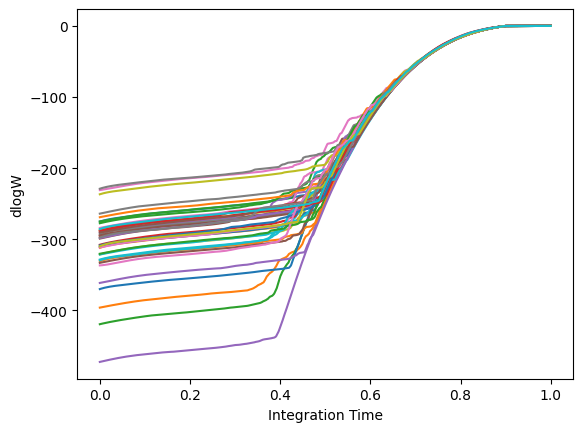

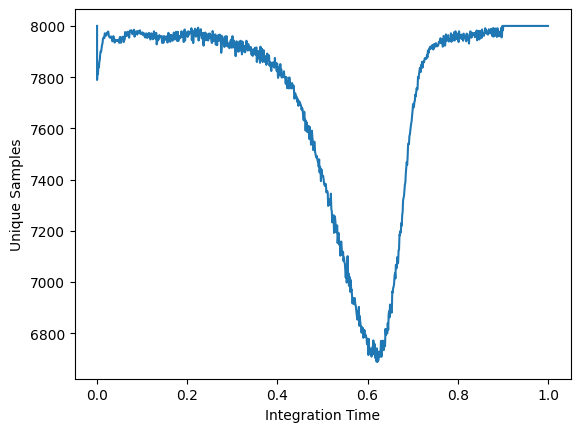

Mean of Energy tensor(-7.0248, device='cuda:0')


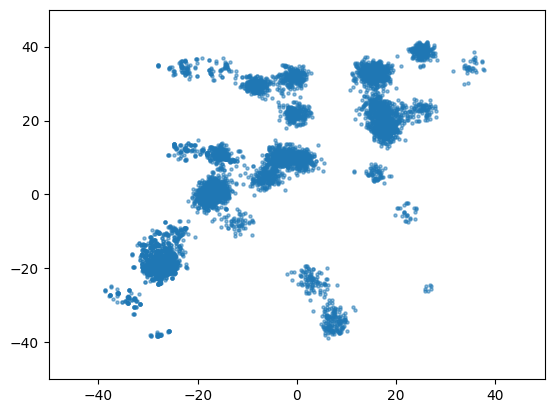

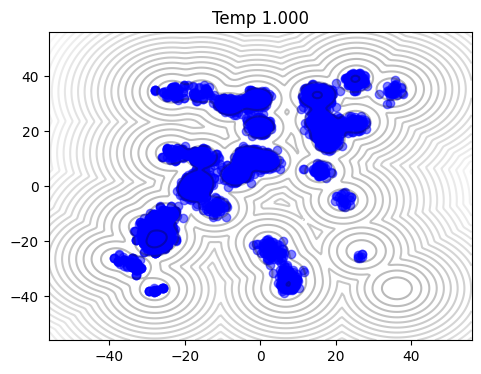

  7%|▋         | 7/100 [04:30<59:47, 38.58s/it]  

Epoch 0 | Loss 0.572708
Epoch 99 | Loss 0.609042
hi
not_resampled data
8000
resampled_data
10


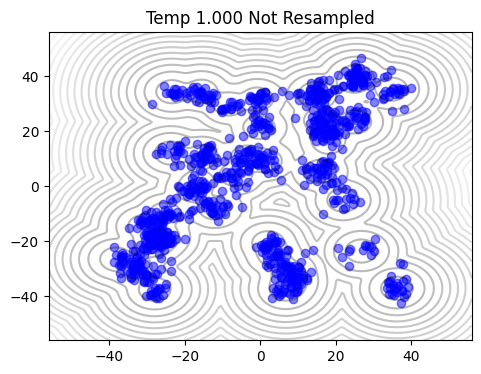

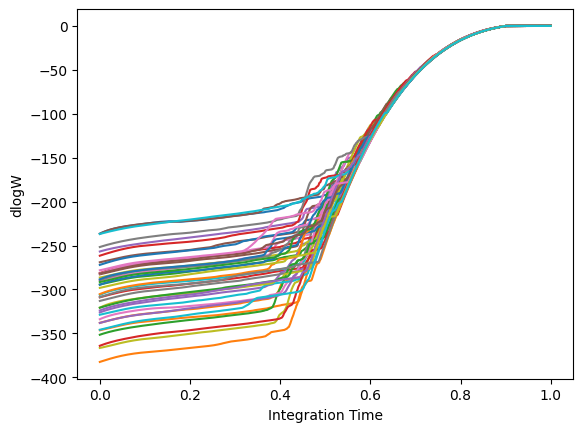

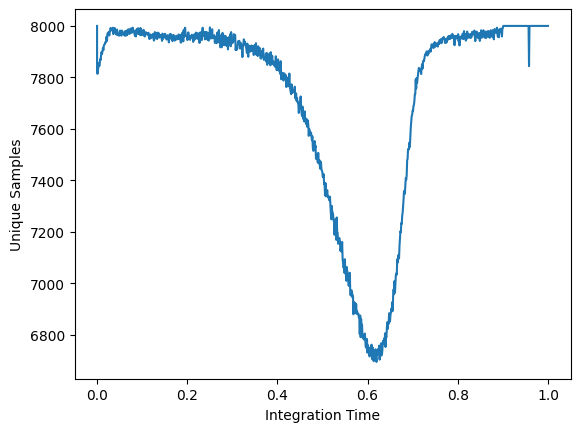

Mean of Energy tensor(-6.9604, device='cuda:0')


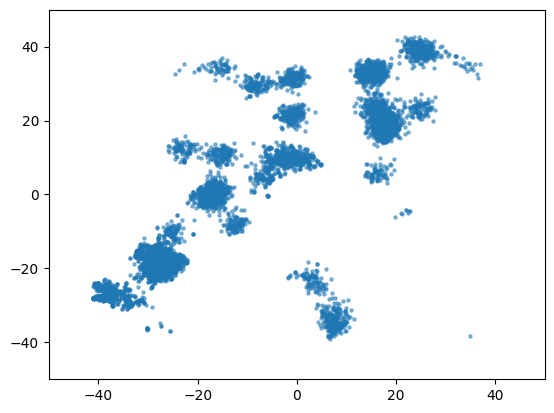

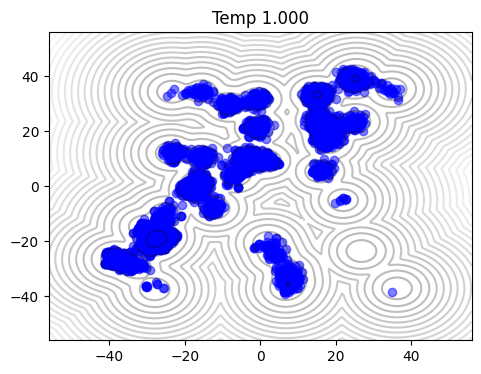

  8%|▊         | 8/100 [05:08<59:03, 38.52s/it]

Epoch 0 | Loss 0.528110
Epoch 99 | Loss 0.548683
hi
not_resampled data
8000
resampled_data
6


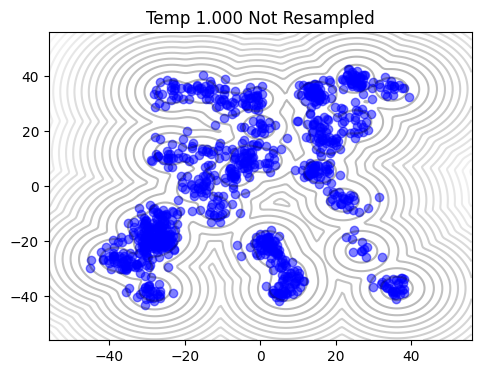

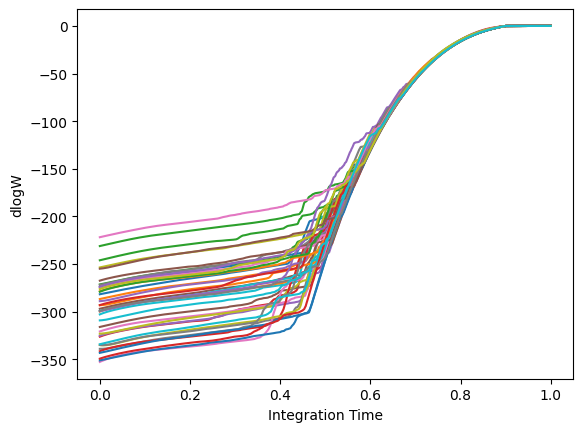

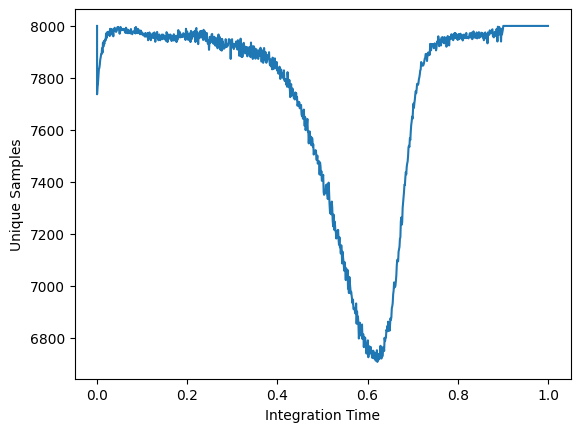

Mean of Energy tensor(-6.9143, device='cuda:0')


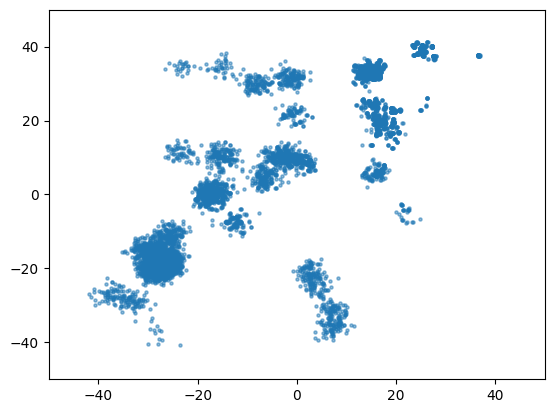

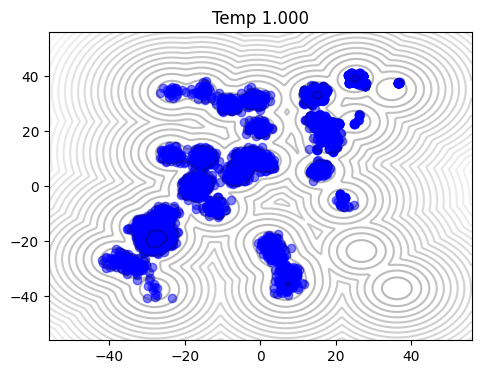

  9%|▉         | 9/100 [05:46<58:17, 38.44s/it]

Epoch 0 | Loss 0.582896
Epoch 99 | Loss 0.577087
hi
not_resampled data
8000
resampled_data
3


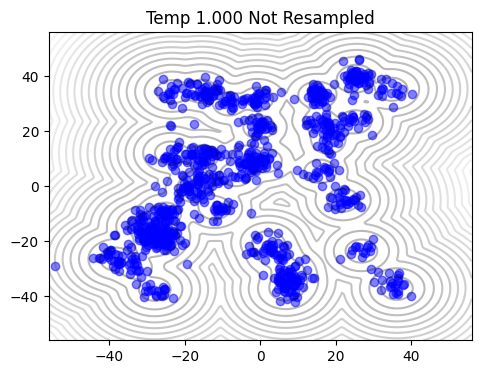

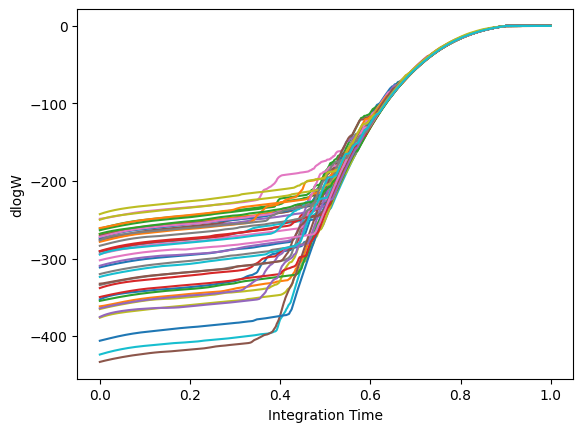

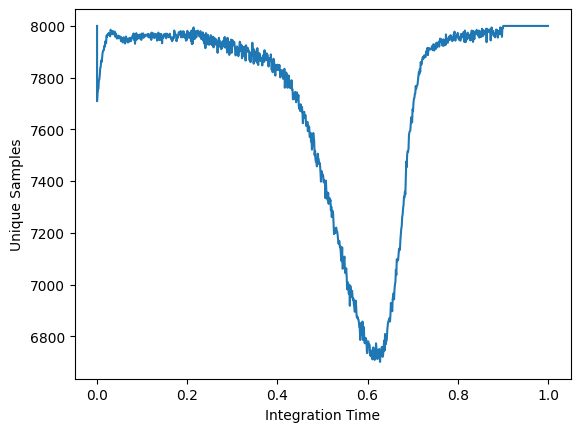

Mean of Energy tensor(-6.9546, device='cuda:0')


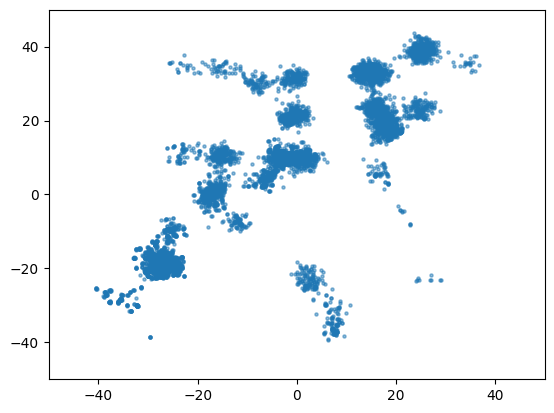

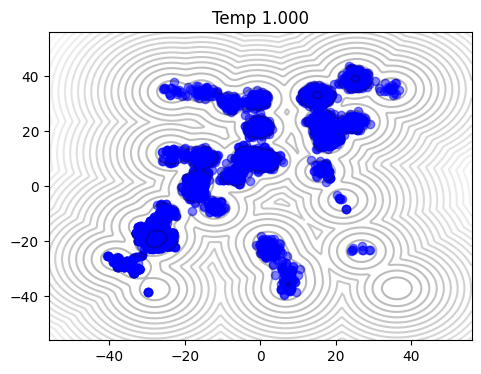

 10%|█         | 10/100 [06:26<57:59, 38.66s/it]

Epoch 0 | Loss 0.650783
Epoch 99 | Loss 0.571536
hi
not_resampled data
8000
resampled_data
4


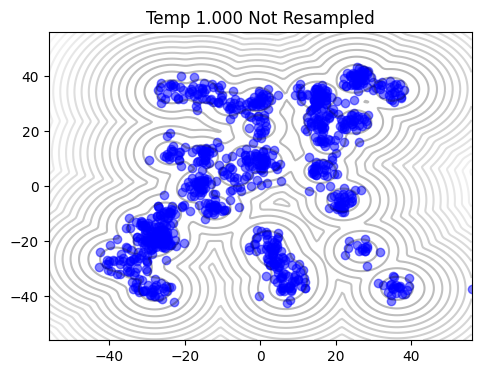

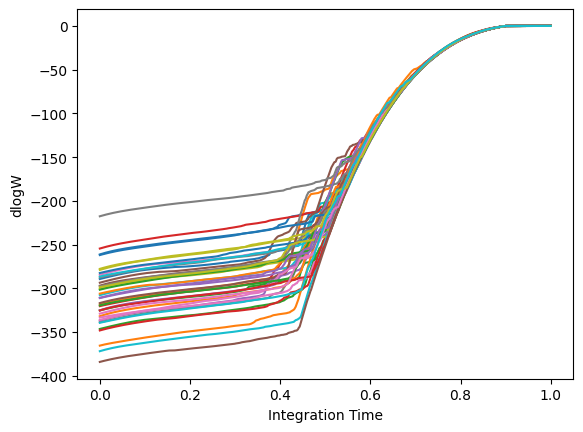

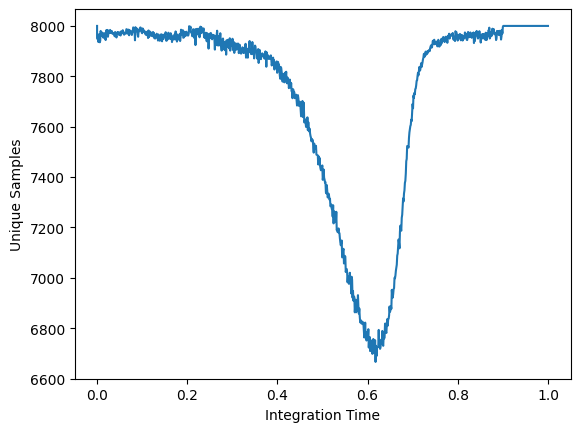

Mean of Energy tensor(-6.9841, device='cuda:0')


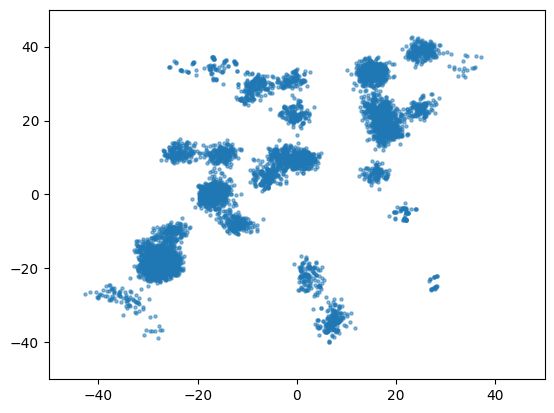

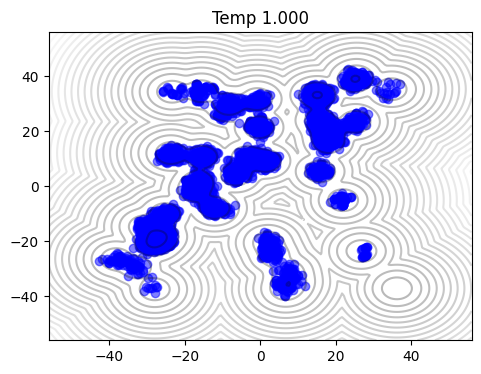

 11%|█         | 11/100 [07:05<57:37, 38.85s/it]

Epoch 0 | Loss 0.489186
Epoch 99 | Loss 0.581854
hi
not_resampled data
8000
resampled_data
2


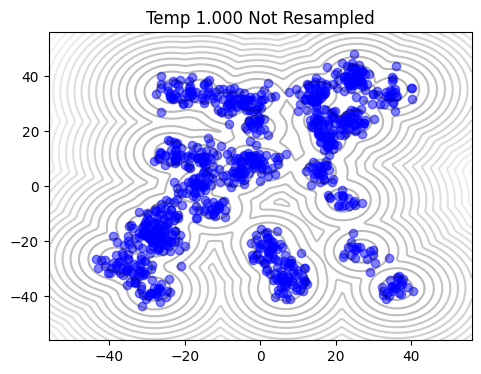

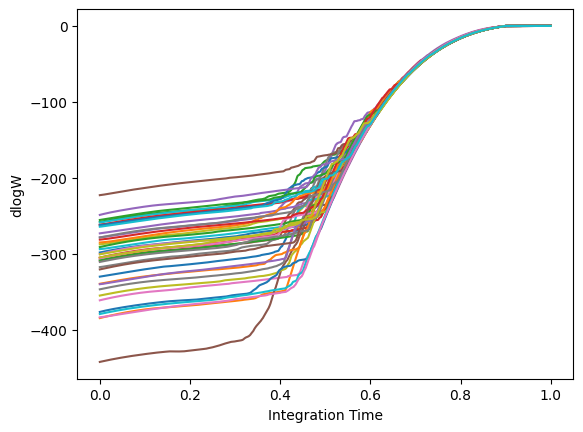

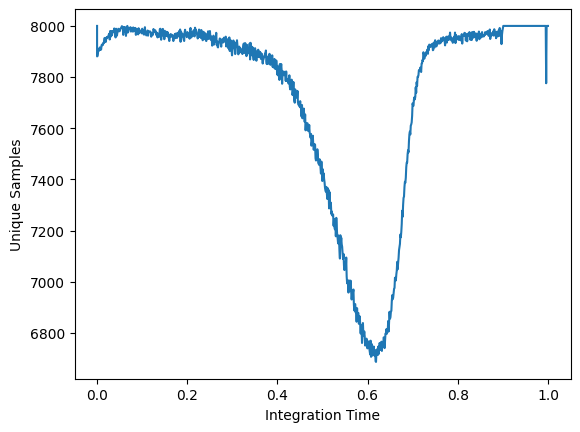

Mean of Energy tensor(-7.0194, device='cuda:0')


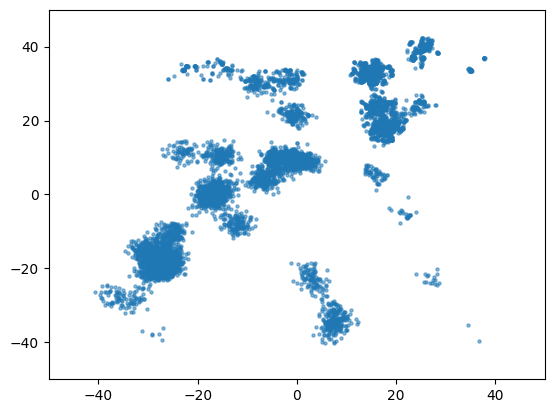

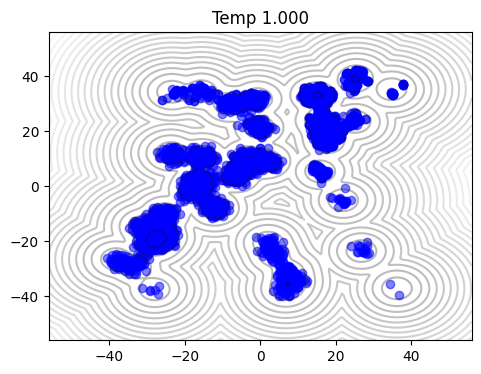

 12%|█▏        | 12/100 [07:44<57:05, 38.93s/it]

Epoch 0 | Loss 0.544250
Epoch 99 | Loss 0.554417
hi
not_resampled data
8000
resampled_data
1


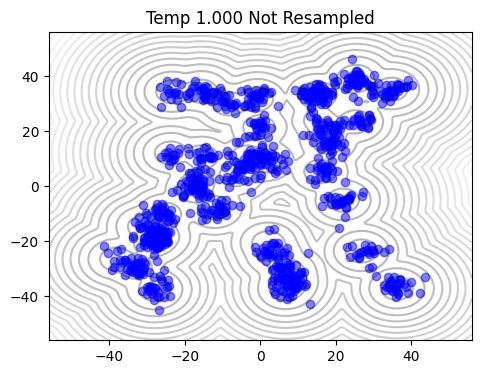

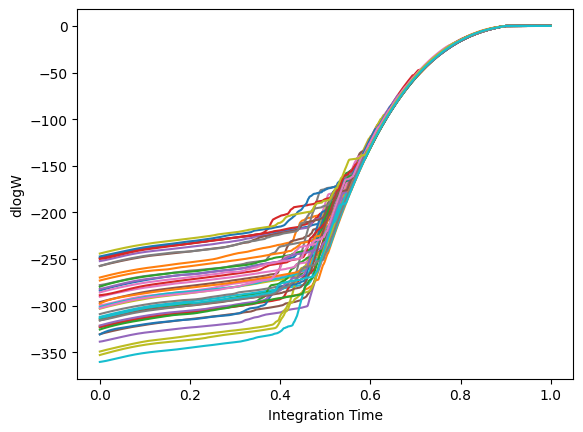

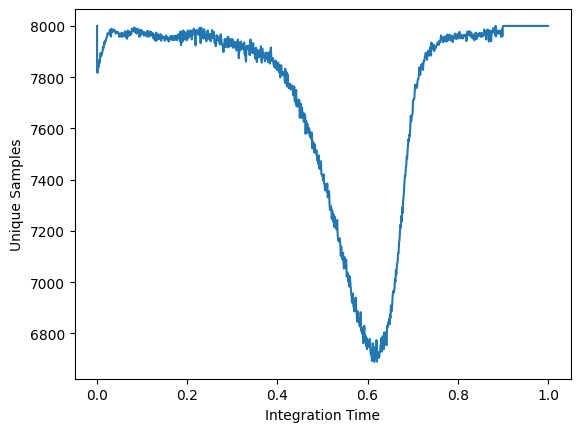

Mean of Energy tensor(-6.9810, device='cuda:0')


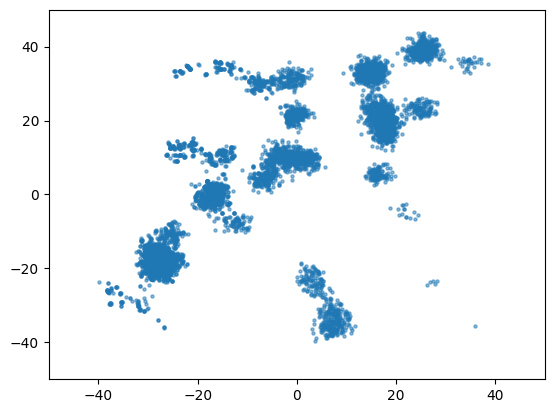

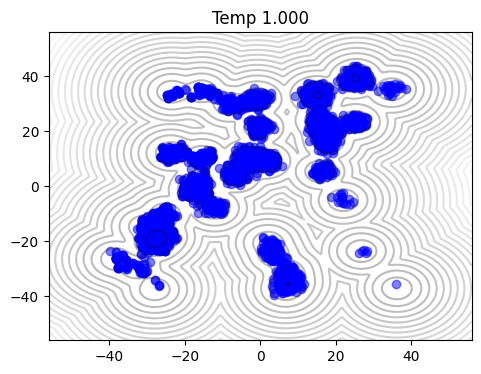

 13%|█▎        | 13/100 [08:23<56:24, 38.91s/it]

Epoch 0 | Loss 0.494483
Epoch 99 | Loss 0.566572
hi
not_resampled data
8000
resampled_data
2


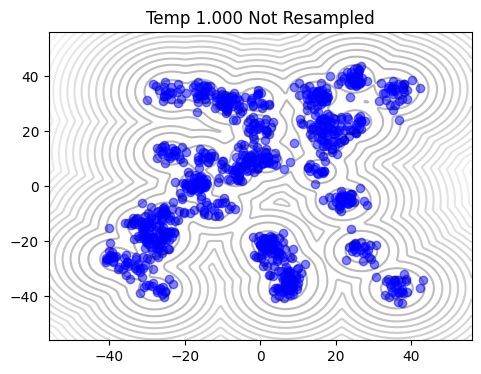

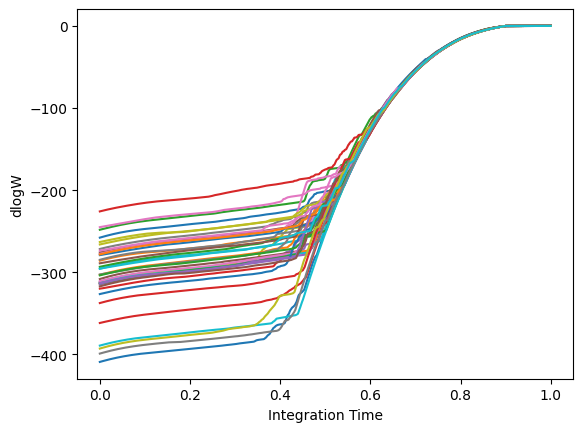

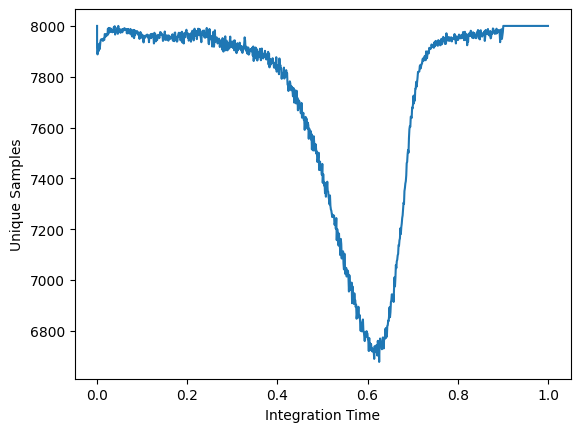

Mean of Energy tensor(-6.9350, device='cuda:0')


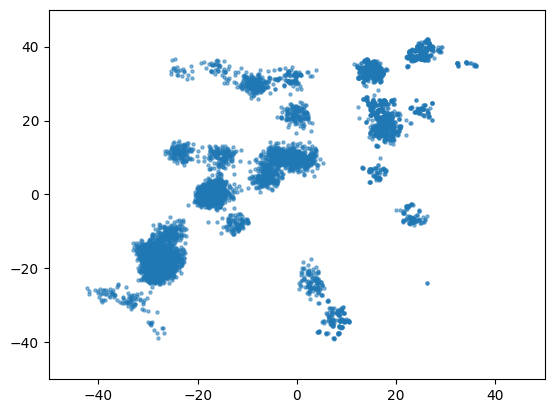

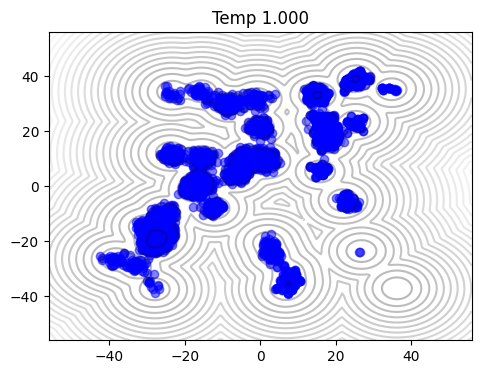

 14%|█▍        | 14/100 [09:01<55:38, 38.82s/it]

Epoch 0 | Loss 0.533229
Epoch 99 | Loss 0.550000
hi
not_resampled data
8000
resampled_data
2


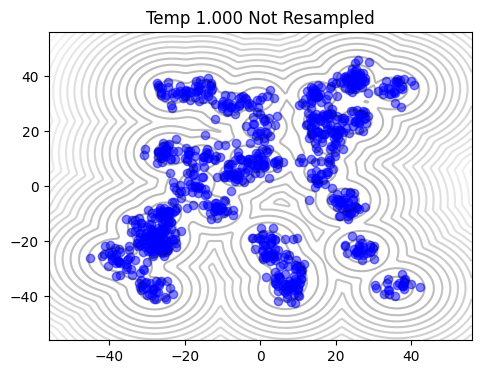

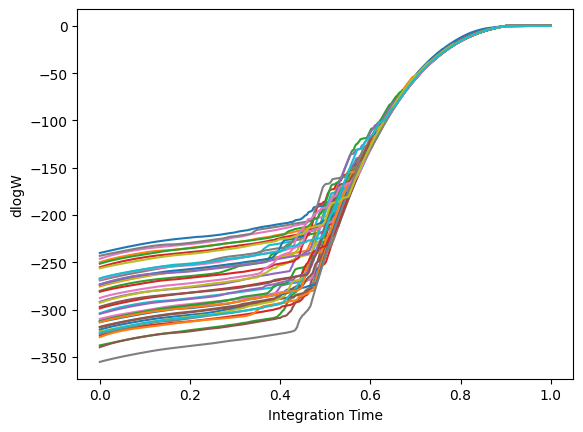

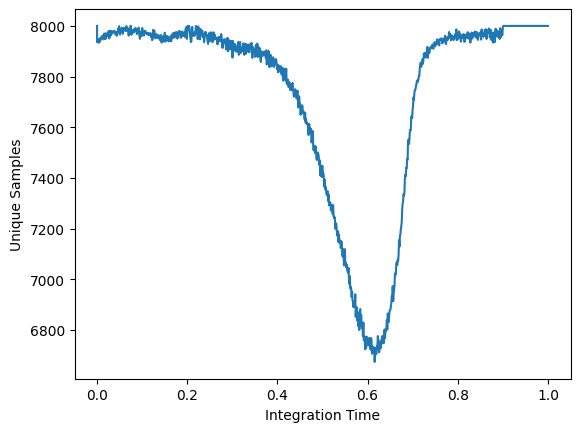

Mean of Energy tensor(-6.9824, device='cuda:0')


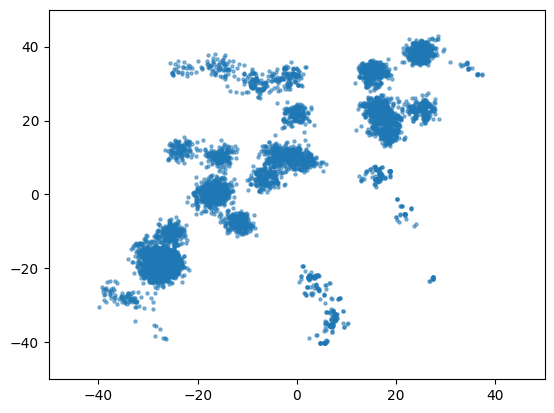

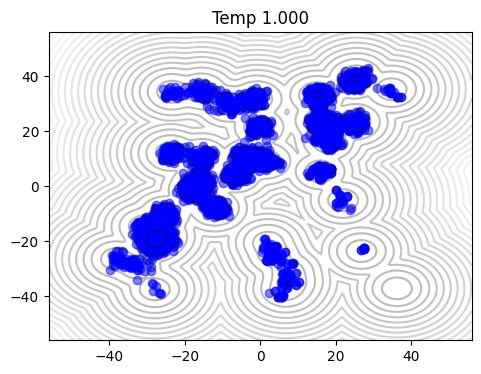

 15%|█▌        | 15/100 [09:40<54:57, 38.80s/it]

Epoch 0 | Loss 0.581760
Epoch 99 | Loss 0.600778
hi
not_resampled data
8000
resampled_data
4


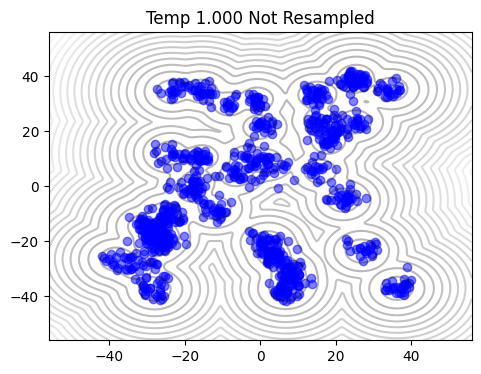

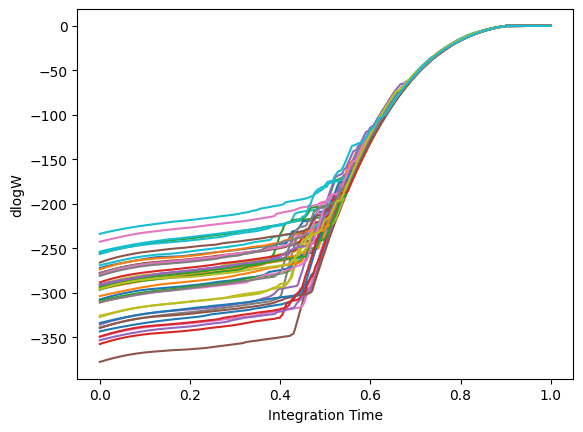

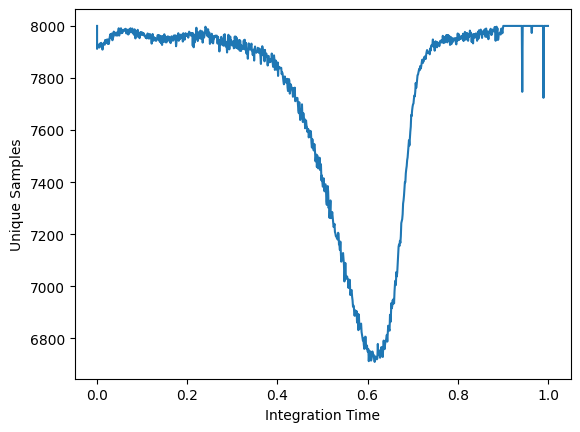

Mean of Energy tensor(-6.9940, device='cuda:0')


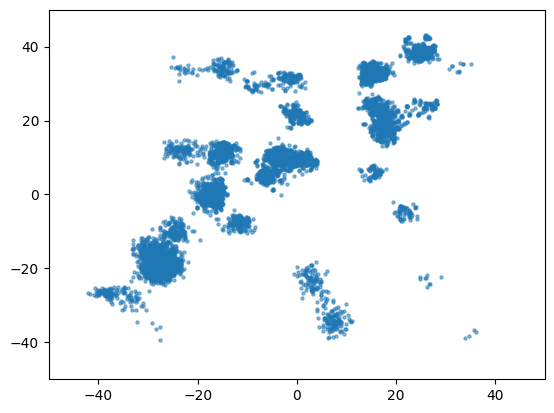

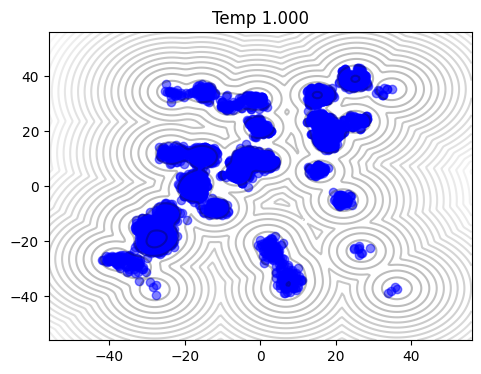

 16%|█▌        | 16/100 [10:19<54:18, 38.79s/it]

Epoch 0 | Loss 0.655314
Epoch 99 | Loss 0.623462
hi
not_resampled data
8000
resampled_data
3


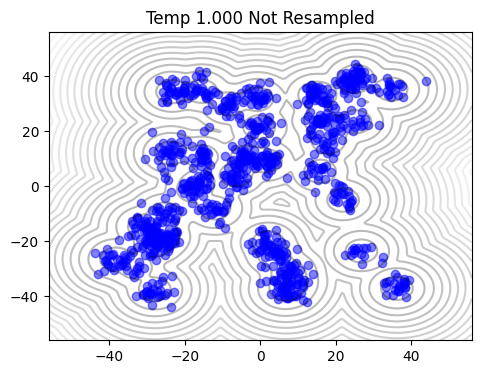

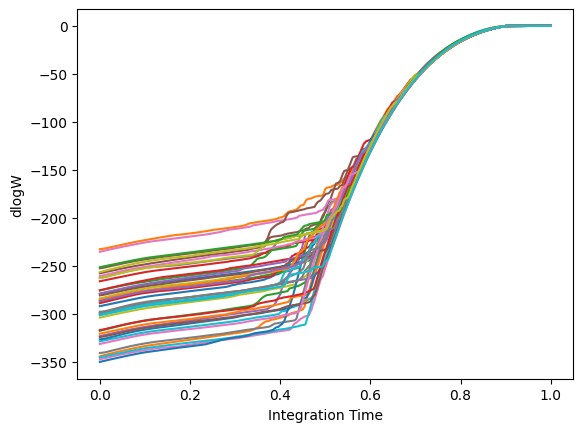

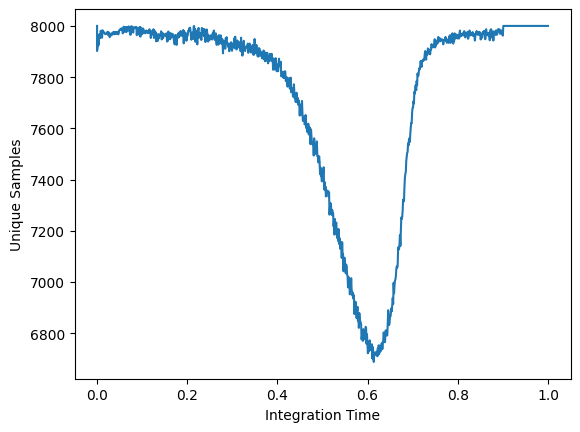

Mean of Energy tensor(-6.9703, device='cuda:0')


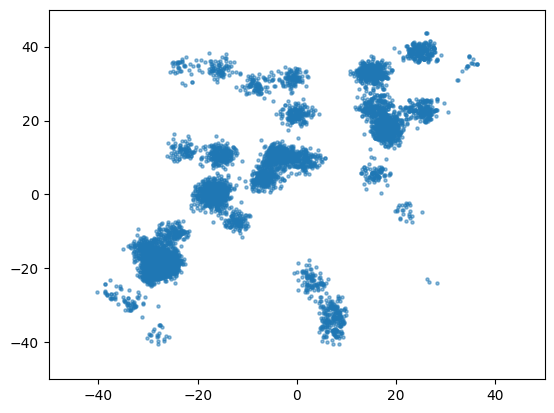

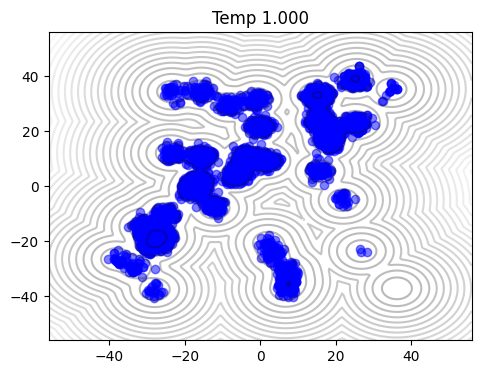

 17%|█▋        | 17/100 [10:57<53:33, 38.72s/it]

Epoch 0 | Loss 0.598523
Epoch 99 | Loss 0.560490
hi
not_resampled data
8000
resampled_data
4


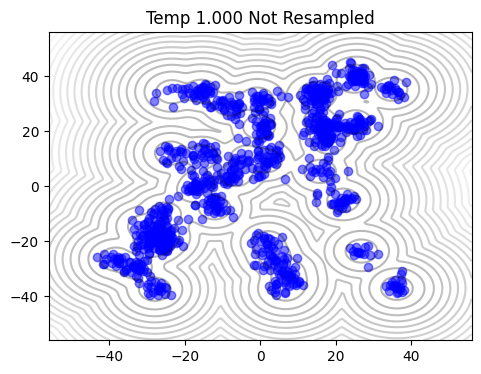

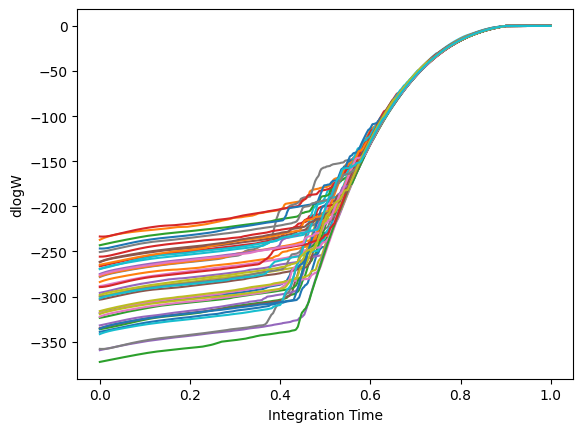

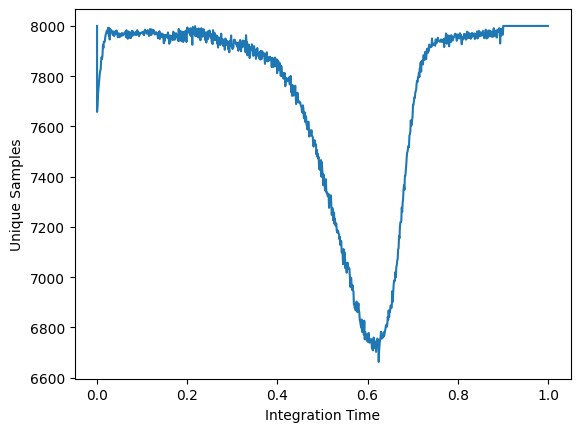

Mean of Energy tensor(-6.9763, device='cuda:0')


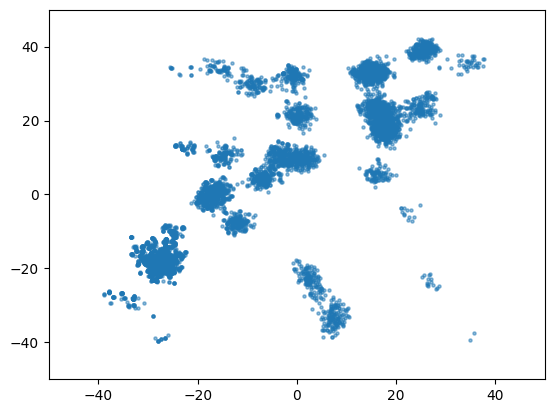

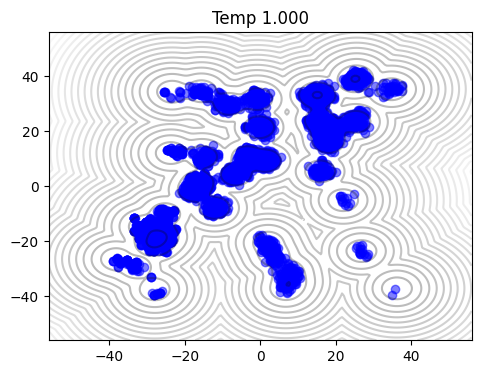

 18%|█▊        | 18/100 [11:37<53:24, 39.08s/it]

Epoch 0 | Loss 0.709444
Epoch 99 | Loss 0.646701
hi
not_resampled data
8000
resampled_data
3


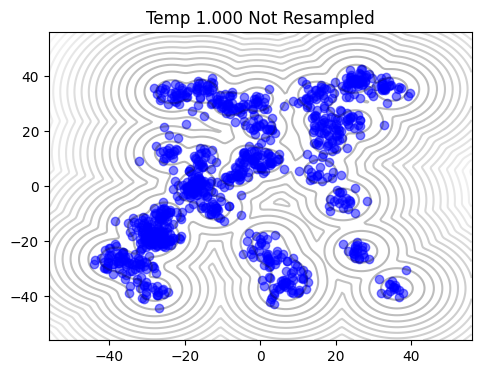

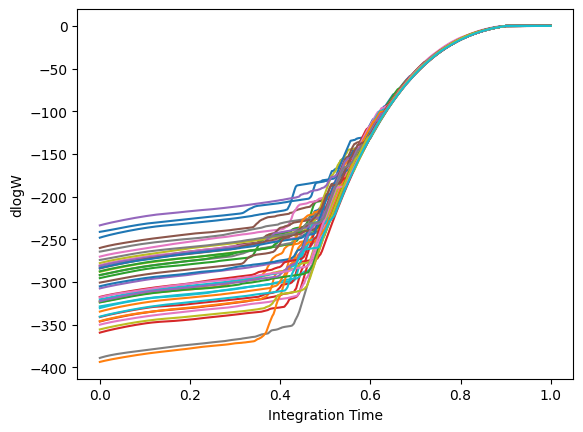

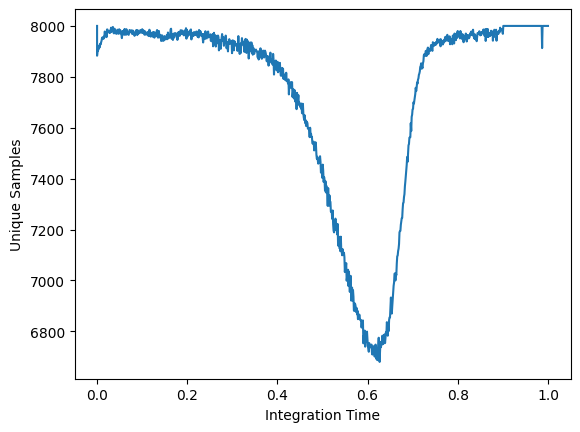

Mean of Energy tensor(-7.0263, device='cuda:0')


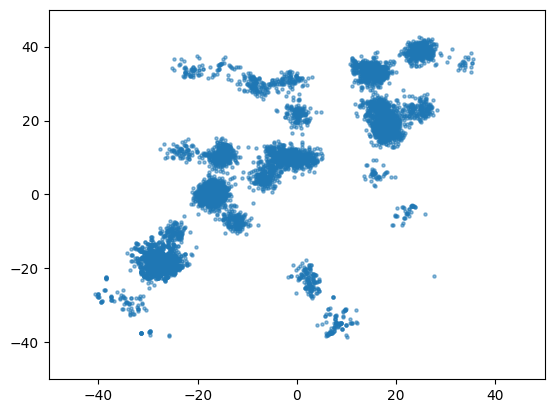

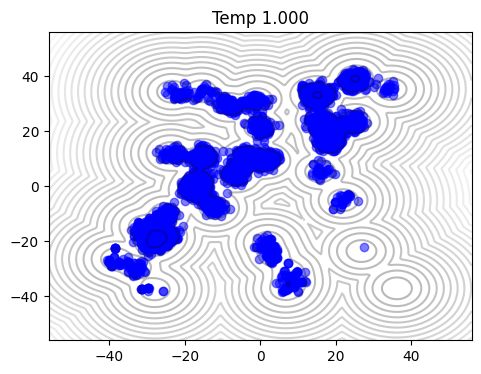

 19%|█▉        | 19/100 [12:17<52:49, 39.13s/it]

Epoch 0 | Loss 0.637470
Epoch 99 | Loss 0.618394
hi
not_resampled data
8000
resampled_data
2


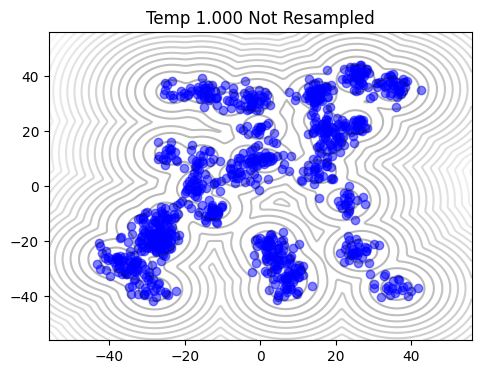

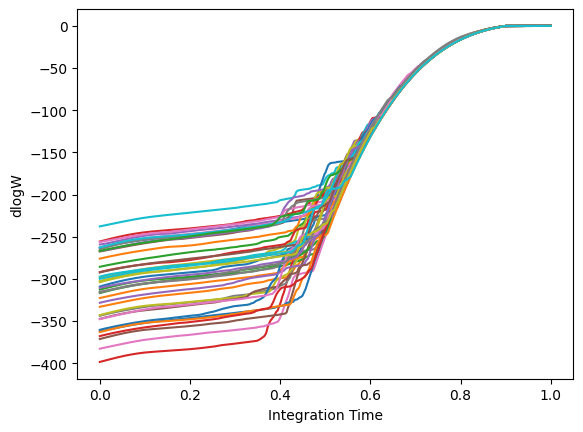

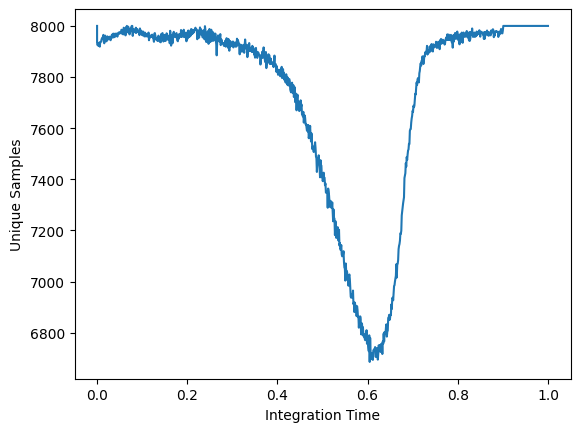

Mean of Energy tensor(-6.9899, device='cuda:0')


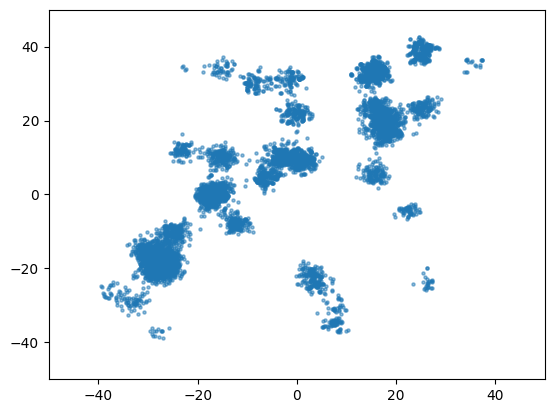

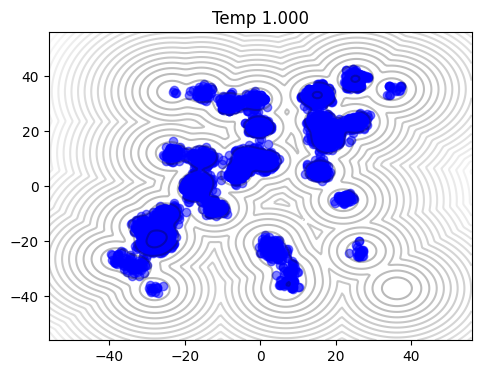

 20%|██        | 20/100 [12:55<52:02, 39.03s/it]

Epoch 0 | Loss 0.551727
Epoch 99 | Loss 0.583740
hi
not_resampled data


 20%|██        | 20/100 [13:13<52:53, 39.66s/it]


KeyboardInterrupt: 

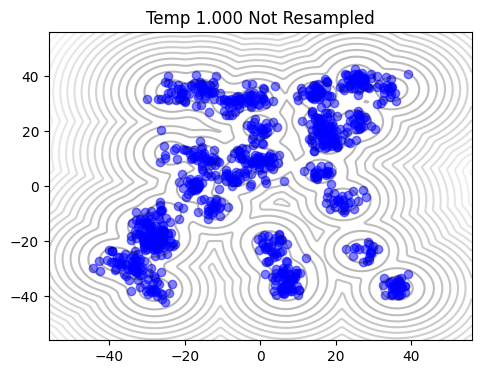

In [29]:
for epoch in tqdm(range(outer_epochs)):
    for epoch in range(inner_epochs):
        # break
        total_loss = 0.0
        for beta in betas:
            for samples, _ in trainloader[beta]:
                samples = samples.to(device)

                optimizer.zero_grad()

                P_mean = -1.2
                P_std = 1.2

                # ln_sigma_t = torch.randn(len(samples)).to(device) * P_std + P_mean
                # h_t = torch.exp(2 * ln_sigma_t)
                t = torch.rand(len(samples)).to(device)
                h_t = noise_schedule.h(t).to(device)

                loss = score_loss(energy_net, samples, h_t, beta)
                total_loss += loss.item()
                loss.backward()
                optimizer.step()

            if epoch % 99 == 0:
                print("Epoch %d | Loss %f" % (epoch, loss.item()))

    # Generate samples using the network
    print("hi")
    ve_reverse_sde = VEReverseSDE(
        energy_net, noise_schedule, score_model=None, pin_energy=True
    )
    resample_at_end = True
    for beta in betas:
        samples_not_resampled, _, _ = generate_samples_weighted(
            ve_reverse_sde,
            prior=priors[beta],
            num_samples=1000,
            t_span=(0, 1),
            resampling_interval=-1,
            inverse_temp=beta,
            resample_at_end=False,
        )
        print("not_resampled data")
        target.get_dataset_fig(
            target.unnormalize(samples_not_resampled),
            title=f"Temp {1/beta:.3f} Not Resampled",
        )

        ve_reverse_sde = VEReverseSDE(
            energy_net, noise_schedule, score_model=None, pin_energy=True, gamma=2.0
        )

        samples, _, choices = generate_samples_weighted(
            ve_reverse_sde,
            prior=priors[beta],
            num_samples=8000,
            t_span=(0, 1),
            resampling_interval=1,
            inverse_temp=beta,
            resample_at_end=resample_at_end,
            diffusion_scale=1,
        )
        print("resampled_data")

        _, log_weights, _ = generate_samples_weighted(
            ve_reverse_sde,
            prior=priors[beta],
            num_samples=1000,
            t_span=(0, 1),
            resampling_interval=2000,
            inverse_temp=beta,
            resample_at_end=resample_at_end,
        )

        # plot log weights
        fig = plt.figure()
        times = torch.linspace(1, 0, 1000)
        if resample_at_end:
            # append 0 to the end of the list
            times = torch.cat([times, torch.tensor([0])])
        plt.plot(times, log_weights.cpu().detach().numpy()[:, :40])
        plt.xlabel("Integration Time")
        plt.ylabel("dlogW")
        plt.show()

        # plot choices
        fig = plt.figure()
        plt.plot(times, choices)
        plt.xlabel("Integration Time")
        plt.ylabel("Unique Samples")
        plt.show()

        samples_energy = target(samples)

        # Update Buffer
        buffer[beta].add(samples, samples_energy)

        print("Mean of Energy", samples_energy.mean())

        samples_unnorm = target.unnormalize(samples)
        plt.scatter(
            samples_unnorm[:, 0].detach().cpu(),
            samples_unnorm[:, 1].detach().cpu(),
            label="Samples",
            alpha=0.5,
            s=5,
        )
        plt.xlim(-50, 50)
        plt.ylim(-50, 50)
        plt.show()
        annealed_target.get_dataset_fig(samples_unnorm, title=f"Temp {1/beta:.3f}")
        plt.show()

        # Resample data from the buffer
        samples, samples_energy, _ = buffer[beta].sample(512 * 10)
        train_dataset = TensorDataset(samples, samples_energy)
        # trainloader[beta] = DataLoader(train_dataset, batch_size=512, shuffle=True)